# Import

In [74]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib
from matplotlib.lines import Line2D
import matplotlib.gridspec as gridspec
plt.style.use('lato_style.mplstyle')

import fidimag.common.constant as C

import os, shutil, glob, re

# Data

Here we load the data from the GNEBM simulations of skyrmions escaping through the boundary of hexagonal islands. We extract the final relaxed energy band from the `ndt` file and compute the energy barriers from the highest energy points. We do this for different applied fields and island sizes:

In [2]:
base_folder = 'hexagonal_system/NEBM/nebm_2Dhex_hexagons_PdFe-Ir_sk-down-escape_B-sweep_DT/'

In [3]:
energy_barriers = {}
energy_bands = {}
distances = {}
energy_bands_interp = {}

R_range = np.array([10, 8, 6, 4, 3])
B_range = np.arange(200, 2001, 100)

for R in R_range:
    
    energy_barriers[R] = {}
    energy_bands[R] = {}
    distances[R] = {}
    energy_bands_interp[R] = {}
    
    for B in B_range:
        
        if R == 10 and B < 800:
            continue
        
        ndt_file = np.loadtxt(base_folder + 'ndts/nebm_2Dhex_hexagon_R{}nm_PdFe-Ir_sk_down-fm_up_B{}mT_CI-GNEBM_energy.ndt'.format(R, B))
        last_energy_band = ndt_file[-1][1:]
        last_energy_band = (last_energy_band - last_energy_band[0]) / C.meV
        
        dYs_file = np.loadtxt(base_folder + 'ndts/nebm_2Dhex_hexagon_R{}nm_PdFe-Ir_sk_down-fm_up_B{}mT_CI-GNEBM_dYs.ndt'.format(R, B))
        dYs_file = np.append([0], dYs_file[-1][1:])
        
        dat_file = np.loadtxt(base_folder + 'dats/nebm_2Dhex_hexagon_R{}nm_PdFe-Ir_sk_down-fm_up_B{}mT_CI-GNEBM_interpolation.dat'.format(R, B))
        dat_file[:, 1] = (dat_file[:, 1] - dat_file[:, 1][0]) / C.meV
        
        energy_bands[R][B] = last_energy_band
        energy_barriers[R][B] = np.max(last_energy_band)
        distances[R][B] = np.cumsum(dYs_file)
        energy_bands_interp[R][B] = dat_file - dat_file[0]

We put the energy barriers data as a function of applied field into single arrays, for different island sizes:

In [4]:
energy_barriers_map = {}

for i, R in enumerate(R_range):
    energy_barriers_map[R] = np.zeros_like(B_range, dtype=np.float64)
    for j, B in enumerate(B_range):
        if R == 10 and B < 800:
            continue
        energy_barriers_map[R][j] = energy_barriers[R][B]

And we can plot the energy barriers:

(0, 60)

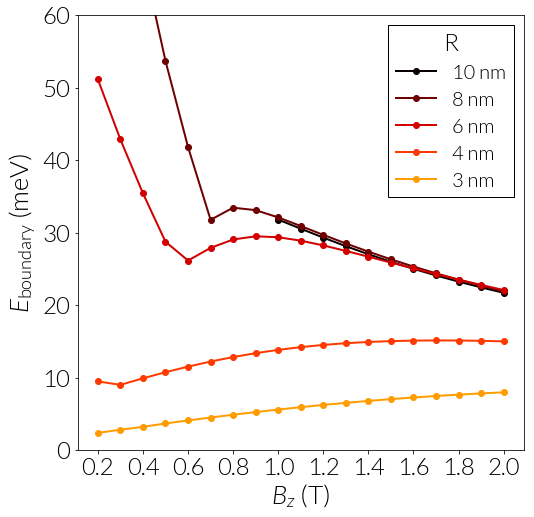

In [120]:
cm_subsection = np.linspace(0.4, 1, len(R_range)) 
cm_colors = [matplotlib.cm.hot_r(x) for x in cm_subsection][-1::-1]

f = plt.figure()
ax = f.add_subplot(111)

for i, R in enumerate(R_range):
    
    if R == 10:
        fields_range = slice(8, None)
    else:
        fields_range = slice(0, None)
        
    ax.plot(B_range[fields_range] * 1e-3, energy_barriers_map[R][fields_range], 'o-', 
            color=cm_colors[i], label='{} nm'.format(R))

ax.set_xticks(B_range[::2] * 1e-3)
ax.set_xticklabels(B_range[::2] * 1e-3)
    
ax.legend(title='R', 
          # loc=(0.05, 0.36),
          loc=1)

ax.set_ylabel(r'$E_{\mathrm{boundary}}$ (meV)')
ax.set_xlabel(r'$B_{z}$ (T)')

ax.set_ylim(0, 60)

# plt.savefig('hexagons_nebm_R_B_skyrmion-escape-energy-barrier_extended.pdf',
#             bbox_inches='tight')

In [14]:
distances[3].keys()

dict_keys([800, 1200, 900, 1400, 1000, 300, 1100, 1500, 1900, 400, 200, 1700, 500, 1800, 2000, 600, 1300, 1600, 700])

We can also observe the whole energy bands for different applied field and hexagon size:

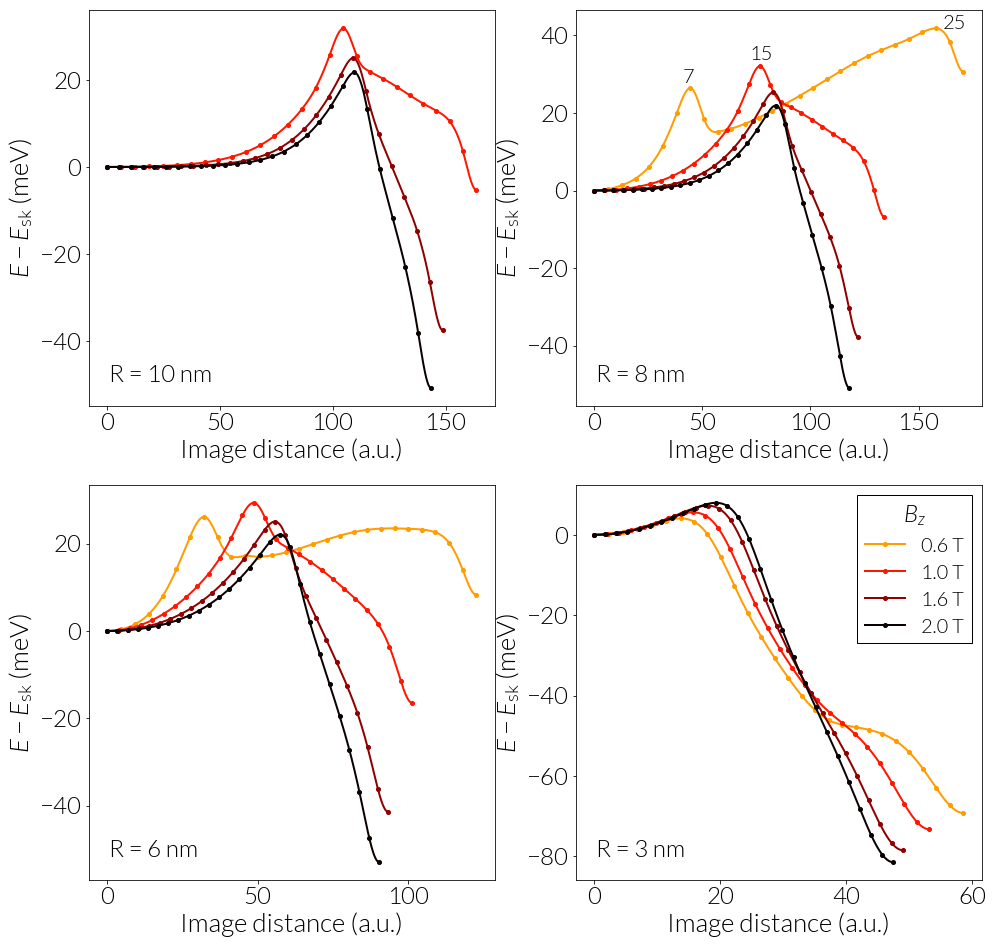

In [83]:
cm_subsection = np.linspace(0.4, 1, 4) 
cm_colors = [matplotlib.cm.hot_r(x) for x in cm_subsection][::]

f = plt.figure(figsize=(16, 16))

for j, R in enumerate([10, 8, 6, 3]):

    ax = f.add_subplot(2, 2, j + 1)

    ps = []

    for i, B in enumerate([600, 1000, 1600, 2000]):
        
        if R == 10 and B < 800:
            continue
        
        p, = ax.plot(distances[R][B], energy_bands[R][B], 'o', color=cm_colors[i],
                label='{:.1f} T'.format(B * 1e-3),
                ms=4
                )
        ps.append(p)

        p, = ax.plot(energy_bands_interp[R][B][:, 0], energy_bands_interp[R][B][:, 1],
                '-', color=cm_colors[i],
                # label='{:.1f} T'.format(B * 1e-3)
                )
        ps.append(p)
        
    ax.set_xlabel('Image distance (a.u.)')
    ax.set_ylabel(r'$E-E_{\mathrm{sk}}$ (meV)')

    ax.text(0.05, 0.05, 'R = {} nm'.format(R), horizontalalignment='left',
            verticalalignment='bottom', transform=ax.transAxes, 
            fontsize=24, rotation=0)

    if j == 3:
        ax.legend(zip(ps[::2], ps[1::2]), [pl.get_label() for pl in ps[::2]],
                  title=r'$B_{z}$')
        
    if j == 1:
        ax.text(41, 27, '7', horizontalalignment='left',
                verticalalignment='bottom',
                fontsize=20, rotation=0)
        
        ax.text(161, 41, '25', horizontalalignment='left',
                verticalalignment='bottom',
                fontsize=20, rotation=0)
        
        ax.text(72, 33, '15', horizontalalignment='left',
                verticalalignment='bottom',
                fontsize=20, rotation=0)
        
plt.savefig('hexagons_nebm_R_B_skyrmion-escape-energy-bands.pdf',
            bbox_inches='tight')

Energy bands for weak fields, $B_{z}\leq0.8\,\,\text{T}$

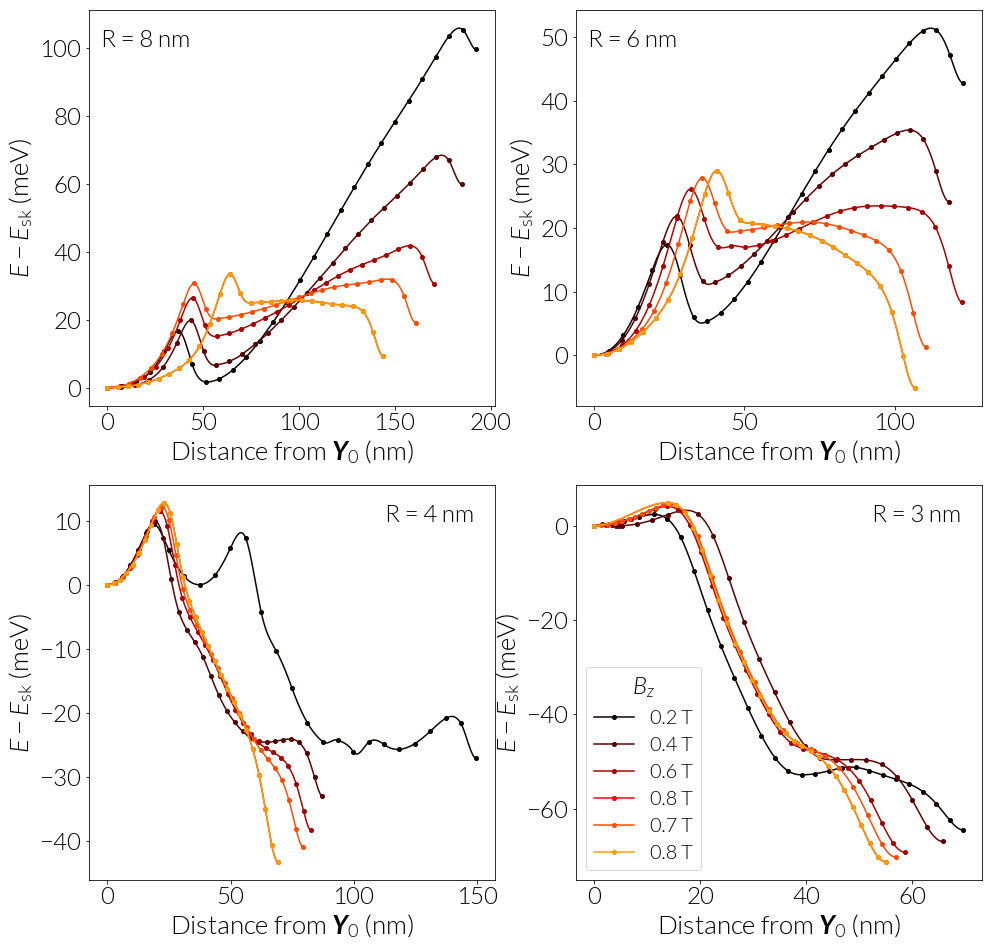

In [202]:
B_range_plot = list(B_range[:7:2]) + [700, 800]

cm_subsection = np.linspace(0.4, 1, len(B_range_plot)) 
cm_colors = [matplotlib.cm.hot_r(x) for x in cm_subsection][-1::-1]

f = plt.figure(figsize=(16, 16))

for j, R in enumerate([8, 6, 4, 3]):
    ax = f.add_subplot(2, 2, j + 1)

    ps = []

    for i, B in enumerate(B_range_plot):
        
        if R == 10 and B < 800:
            continue
        
        p, = ax.plot(distances[R][B], energy_bands[R][B], 'o', color=cm_colors[i],
                label='{:.1f} T'.format(B * 1e-3),
                ms=4
                )
        ps.append(p)

        p, = ax.plot(energy_bands_interp[R][B][:, 0], energy_bands_interp[R][B][:, 1],
                '-', color=cm_colors[i],
                # label='{:.1f} T'.format(B * 1e-3)
                )
        ps.append(p)
        
    ax.set_xlabel(r'Distance from $\mathbf{Y}_{0}$ (nm)')
    ax.set_ylabel(r'$E-E_{\mathrm{sk}}$ (meV)')

    if j > 1:
        tpos = (0.95, 0.95)
    else:
        tpos = (0.25, 0.95)

    ax.text(tpos[0], tpos[1], 'R = {} nm'.format(R), horizontalalignment='right',
            verticalalignment='top', transform=ax.transAxes, 
            fontsize=24, rotation=0)

    if j == 3:
        ax.legend(zip(ps[::2], ps[1::2]), [pl.get_label() for pl in ps[::2]],
                  title=r'$B_{z}$', loc=3)
        
# plt.savefig('hexagons_nebm_R_B_skyrmion-escape-energy-bands.pdf',
#             bbox_inches='tight')

We can try to observe these transitions using the `npt` library:

In [60]:
import nebm_plot_tools.nebm_plot_tools as npt
from IPython.display import Image

/home/david/anaconda3/lib/python3.5/site-packages/nebm_plot_tools/nebm_plot_tools.py:14: UserWarning: The Energy scale is in Joules. If you want to use a different energy scale, you can redefine the neb_plot_functions.scale variable and, to change the labels, use the neb_plot_functions.scale_label variable. In this way, the energy data will be divided by *scale*, e.g. 
 import nebm_plot_tools as npt 
npt.scale = 1000 
npt.scale_label = 'kJ' 
  warnings.warn(imp_message)


In [61]:
def last_GNEBM_state(R, B):
    _folder = base_folder + 'vtks/nebm_2Dhex_hexagon_R{}nm_PdFe-Ir_sk_down-fm_up_B{}mT_CI-GNEBM'.format(R, B)
    _folder = sorted(glob.glob(_folder + '*'),
                     key=lambda f: int(re.search('(?<=GNEBM_)\d+', f).group(0)))[-1]
    return os.path.basename(_folder)

In [84]:
# for B in [300, 700, 1000]:
#     npt.plot_mayavi2(last_GNEBM_state(8, B), list(range(0, 28, 2)) + [27], 
#                      cmap='gist_earth',
#                      gridn='5x3', 
#                      rel_folder=base_folder,
#                      savef='grid.png', 
#                      text_fontsize=120, 
#                      camera_distance=28,
#                      # zoom=3
#                      )
    
for B in [600]:
    npt.plot_mayavi2(last_GNEBM_state(8, B), list(range(0, 22, 2)) + [7, 8, 24, 25, 27], 
                 cmap='gist_earth',
                 gridn='5x3', 
                 rel_folder=base_folder,
                 savef='grid.png', 
                 text_fontsize=120, 
                 camera_distance=31,
                 # zoom=3
                 )
    
for B in [1000]:
    npt.plot_mayavi2(last_GNEBM_state(8, B), list(range(0, 26, 2)) + [15, 27], 
                 cmap='gist_earth',
                 gridn='5x3', 
                 rel_folder=base_folder,
                 savef='grid.png', 
                 text_fontsize=120, 
                 camera_distance=31,
                 # zoom=3
                 )

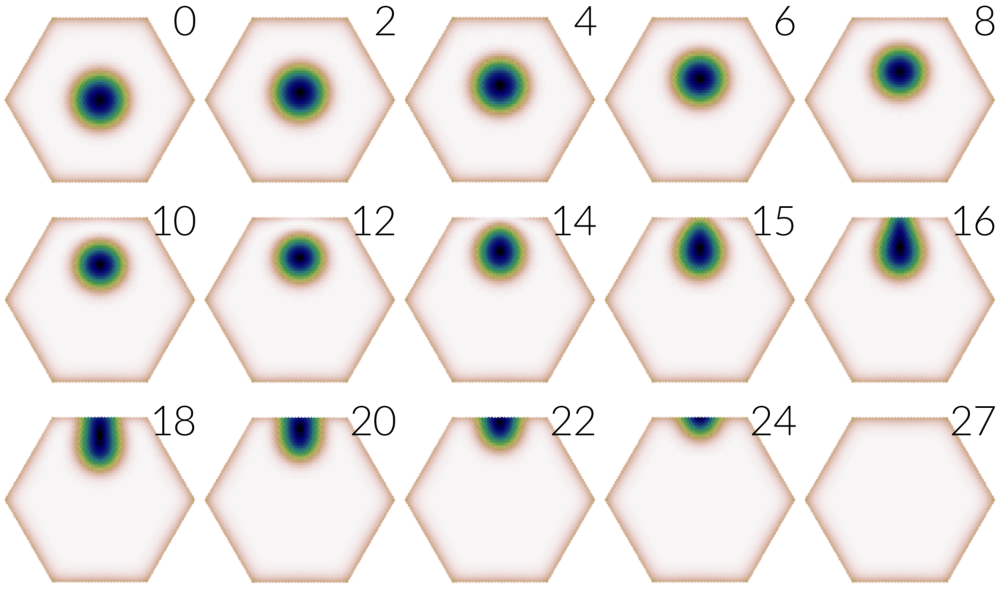

In [85]:
Image(os.path.join('png', last_GNEBM_state(8, 1000), 'grid.png'), width=500)

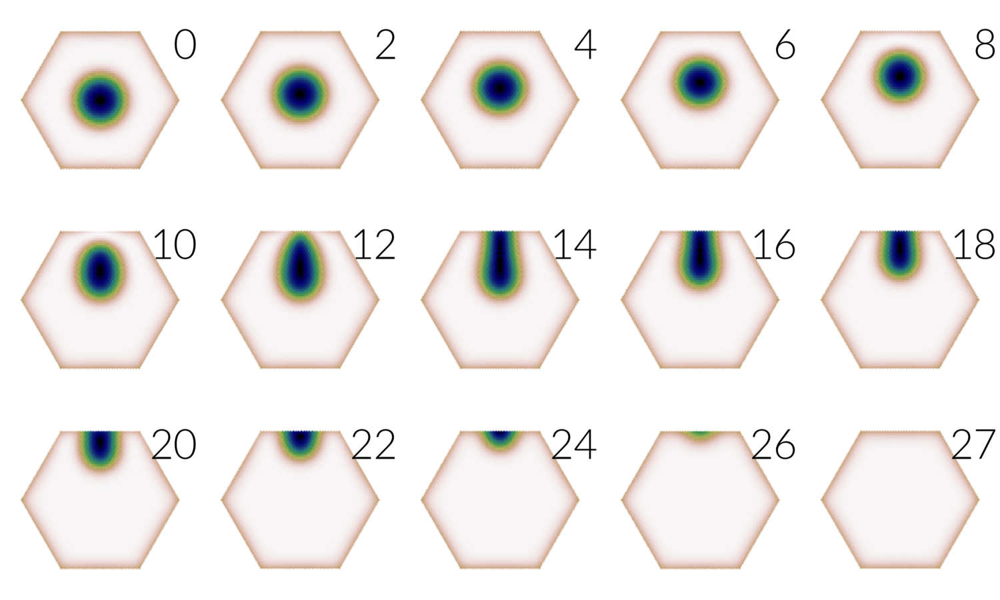

In [52]:
Image(os.path.join('png', last_GNEBM_state(8, 800), 'grid.png'), width=500)

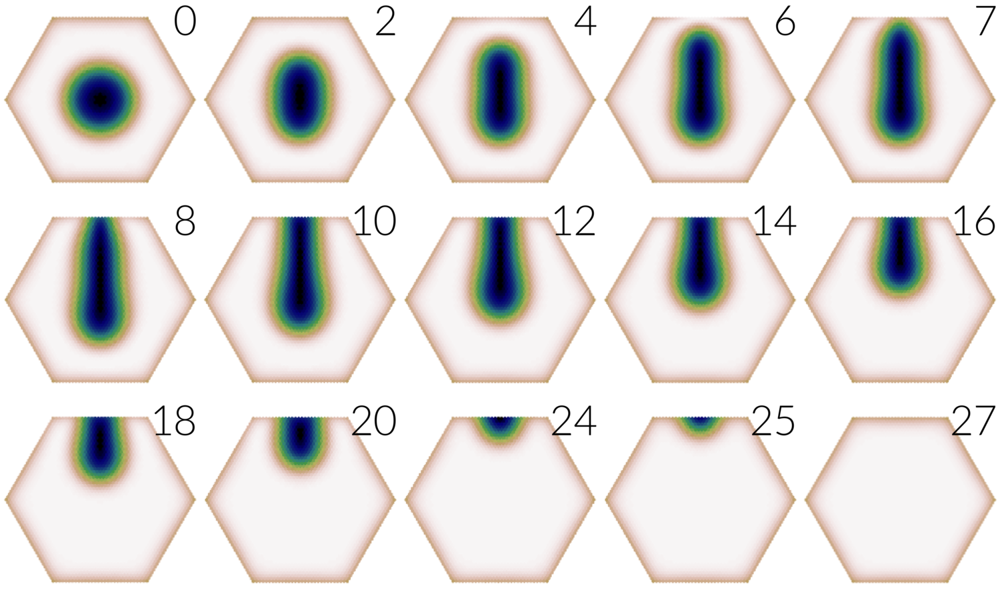

In [72]:
Image(os.path.join('png', last_GNEBM_state(8, 600), 'grid.png'), width=500)

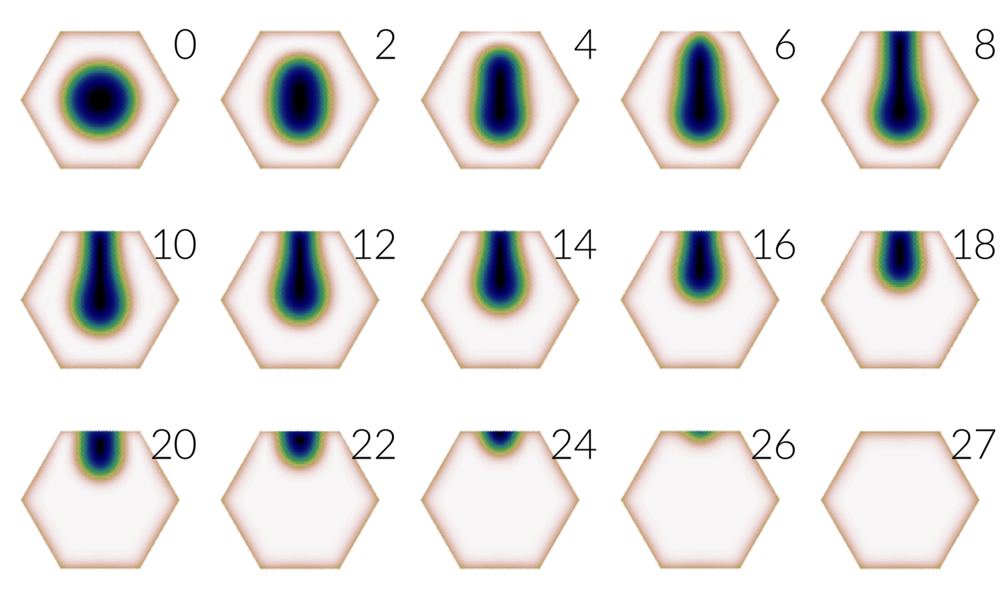

In [57]:
Image(os.path.join('png', last_GNEBM_state(8, 300), 'grid.png'), width=500)

In [77]:
for B in [1000]:
    npt.plot_mayavi2(last_GNEBM_state(6, B), list(range(0, 28, 2)) + [27], 
                     cmap='YlOrRd',
                     gridn='5x3', 
                     rel_folder=base_folder,
                     savef='grid.png', 
                     text_fontsize=120, 
                     camera_distance=20,
                     zoom=3,
                     annotate_numbers=False
                     )

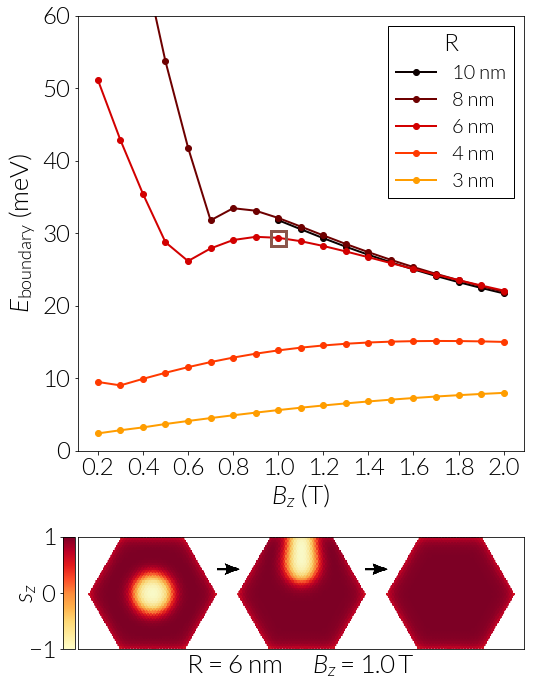

In [132]:
cm_subsection = np.linspace(0.4, 1, len(R_range)) 
cm_colors = [matplotlib.cm.hot_r(x) for x in cm_subsection][-1::-1]

f = plt.figure()
ax = f.add_subplot(111)

for i, R in enumerate(R_range):
    
    if R == 10:
        fields_range = slice(8, None)
    else:
        fields_range = slice(0, None)
        
    ax.plot(B_range[fields_range] * 1e-3, energy_barriers_map[R][fields_range], 'o-', 
            color=cm_colors[i], label='{} nm'.format(R))

ax.set_xticks(B_range[::2] * 1e-3)
ax.set_xticklabels(B_range[::2] * 1e-3)
    
ax.legend(title='R', 
          # loc=(0.05, 0.36),
          loc=1)

ax.set_ylabel(r'$E_{\mathrm{boundary}}$ (meV)')
ax.set_xlabel(r'$B_{z}$ (T)')

ax.set_ylim(0, 60)

# -----------------------------------------------------------------------------

box = ax.get_position()
axIm = plt.axes([box.x0, -0.25, box.width, box.height - 0.5])
axIm.set_xticks([])
axIm.set_yticks([])
axIm.imshow(plt.imread('inkscape/sk_fm_escape_transition/transition.png'))
axIm.set_xlabel(r'R = 6 nm      $B_{z}=1.0\,\mathrm{T}$')
ax.plot(B_range[8] * 1e-3, energy_barriers_map[6][8], 's',
         color='C5', markerfacecolor='None', ms=15, mew=3
         )

# Draw a colorbar
box = axIm.get_position()
axCb = plt.axes([box.x0 - 0.025, -0.22, 0.02, 0.195])
cb = matplotlib.colorbar.ColorbarBase(axCb, plt.cm.YlOrRd, orientation="vertical",
                                      ticks=[-1, 0, 1], 
                                      norm=matplotlib.colors.Normalize(vmin=-1, vmax=1))
cb.set_label(r'$s_{z}$', rotation=90, y=.5, labelpad=-60)
axCb.yaxis.set_ticks_position('left')

# -----------------------------------------------------------------------------

plt.savefig('hexagons_nebm_R_B_skyrmion-escape-energy-barrier_extended.pdf',
            bbox_inches='tight')